# **Importing libraries**

In [3]:
from keras.datasets import cifar10
import matplotlib.pyplot as plt
from numpy import shape, float32
from numpy.random import randint, seed
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPooling2D, Dropout
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorboard.plugins.hparams import api as hp


seed(3)

# Loading the dataset
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
label_names = {0:'airplane',
                1:'automobile',
                2:'bird',
                3:'cat',
                4:'deer',
                5:'dog',
                6:'frog',
                7:'horse',
                8:'ship',
                9:'truck'}

170508288/170498071 [==============================] - 11s 0us/step


# **Visualize the data along with classes**

Number of training data: 50000
Number of testing data: 10000
Images size is (32, 32, 3)


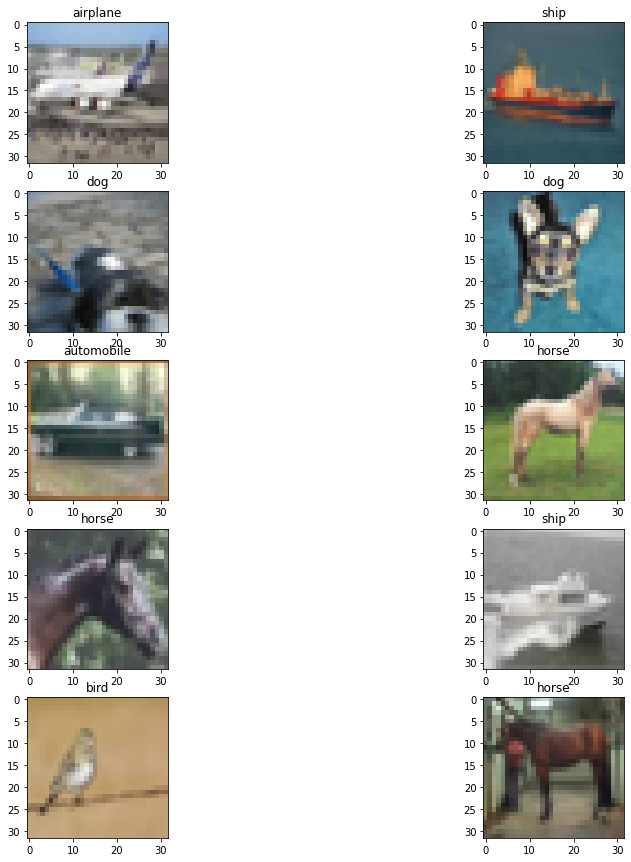

In [4]:
training_number = len(x_train)
testing_number = len(x_test)
image_size = shape(x_train[0])
print(f'Number of training data: {training_number}')
print(f'Number of testing data: {testing_number}')
print(f'Images size is {image_size}')
fig, ax = plt.subplots(5, 2, figsize=(15, 15))
for row in range(len(ax)):
    for column in range(len(ax[0])):
        data_index = randint(training_number)
        ax[row][column].imshow(x_train[data_index])
        ax[row][column].set_title(label_names[y_train[data_index][0]])

# **Pre-processing**

In [5]:
# One hot encoding the target data
y_train_encoded = to_categorical(y_train, dtype=float32)
y_test_encoded = to_categorical(y_test, dtype=float32)
print(f'Target shape before one hot encoding: {shape(y_train)}')
print(f'Target shape after one hot encoding: {shape(y_train_encoded)}')

# Converting images to float32
x_train = x_train.astype(float32)
x_test = x_test.astype(float32)

# Normalizing images to range [0, 1]
x_train_n = x_train/255.
x_test_n = x_test/255.

Target shape before one hot encoding: (50000, 1)
Target shape after one hot encoding: (50000, 10)


# **Design the CNN and your choice for the hyper parameters**

In [6]:
# Defining a baseline with 2 VGG blocks
model1 = Sequential()
model1.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 3)))
model1.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model1.add(MaxPooling2D((2, 2)))
model1.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model1.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model1.add(MaxPooling2D((2, 2)))
model1.add(Flatten())
model1.add(Dense(128, activation='relu'))
model1.add(Dense(10, activation='softmax'))
model1.add(Flatten())
model1.add(Dense(10, activation='softmax'))

# **Evaluate the model and identify does it have overfitting or underfitting problems? How do you resolve these issues?**

In [7]:
# Compiling the model 
opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model1.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
# Fitting the model
history_wo_dropout = model1.fit(x_train_n, y_train_encoded, epochs=100, batch_size=64, validation_data=(x_test_n, y_test_encoded))
# Model evaluation

Epoch 1/100
782/782 [==============================] - 39s 12ms/step - loss: 2.0764 - accuracy: 0.2481 - val_loss: 1.8818 - val_accuracy: 0.3019
Epoch 2/100
782/782 [==============================] - 9s 11ms/step - loss: 1.7738 - accuracy: 0.3223 - val_loss: 1.6755 - val_accuracy: 0.3487
Epoch 3/100
782/782 [==============================] - 9s 11ms/step - loss: 1.6050 - accuracy: 0.3624 - val_loss: 1.5692 - val_accuracy: 0.3583
Epoch 4/100
782/782 [==============================] - 9s 11ms/step - loss: 1.4850 - accuracy: 0.3919 - val_loss: 1.4562 - val_accuracy: 0.4004
Epoch 5/100
782/782 [==============================] - 9s 11ms/step - loss: 1.4079 - accuracy: 0.4159 - val_loss: 1.4558 - val_accuracy: 0.4056
Epoch 6/100
782/782 [==============================] - 9s 11ms/step - loss: 1.3396 - accuracy: 0.4458 - val_loss: 1.3484 - val_accuracy: 0.4481
Epoch 7/100
782/782 [==============================] - 9s 11ms/step - loss: 1.2794 - accuracy: 0.4719 - val_loss: 1.3826 - val_accuracy

In [8]:
# Adding dropout to the same model and training it
model2 = Sequential()
model2.add(Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 3)))
model2.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model2.add(MaxPooling2D((2, 2)))
model2.add(Dropout(0.2))
model2.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model2.add(Conv2D(64, kernel_size=(3, 3), activation='relu'))
model2.add(MaxPooling2D((2, 2)))
model2.add(Dropout(0.2))
model2.add(Flatten())
model2.add(Dense(128, activation='relu'))
model2.add(Dropout(0.2))
model2.add(Dense(10, activation='softmax'))
model2.add(Flatten())
model2.add(Dense(10, activation='softmax'))

opt = tf.keras.optimizers.Adam(learning_rate=0.001)
model2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['accuracy'])
# Fitting the model
history_w_dropout = model2.fit(x_train_n, y_train_encoded, epochs=100, batch_size=64, validation_data=(x_test_n, y_test_encoded))
# Model evaluation

Epoch 1/100
782/782 [==============================] - 10s 12ms/step - loss: 2.0856 - accuracy: 0.2107 - val_loss: 1.9528 - val_accuracy: 0.2673
Epoch 2/100
782/782 [==============================] - 9s 12ms/step - loss: 1.8546 - accuracy: 0.3036 - val_loss: 1.7560 - val_accuracy: 0.3383
Epoch 3/100
782/782 [==============================] - 9s 12ms/step - loss: 1.6637 - accuracy: 0.3664 - val_loss: 1.5564 - val_accuracy: 0.4333
Epoch 4/100
782/782 [==============================] - 9s 12ms/step - loss: 1.5091 - accuracy: 0.4327 - val_loss: 1.4432 - val_accuracy: 0.4707
Epoch 5/100
782/782 [==============================] - 9s 12ms/step - loss: 1.3956 - accuracy: 0.4734 - val_loss: 1.3315 - val_accuracy: 0.4960
Epoch 6/100
782/782 [==============================] - 9s 12ms/step - loss: 1.3048 - accuracy: 0.5079 - val_loss: 1.2531 - val_accuracy: 0.5269
Epoch 7/100
782/782 [==============================] - 10s 13ms/step - loss: 1.2317 - accuracy: 0.5381 - val_loss: 1.2015 - val_accurac

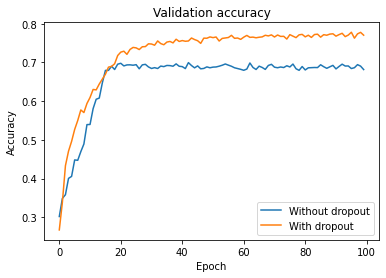

In [9]:
plt.plot(history_wo_dropout.history['val_accuracy'])
plt.plot(history_w_dropout.history['val_accuracy'])
plt.title('Validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Without dropout', 'With dropout'])

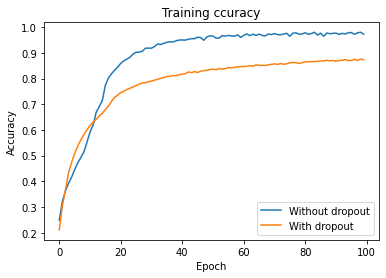

In [10]:
plt.plot(history_wo_dropout.history['accuracy'])
plt.plot(history_w_dropout.history['accuracy'])
plt.title('Training ccuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Without dropout', 'With dropout'])

# **Hyper parameter tuning**

In [11]:
# Loading the tensorboard
%load_ext tensorboard

# Removing previous logs
!rm -rf ./logs/

# Defining hyper parameters
NUM_UNITS = hp.HParam('num_units', hp.Discrete([32, 64]))
DROPOUT = hp.HParam('dropout', hp.Discrete([0.2, 0.3]))
LR = hp.HParam('lr', hp.Discrete([1e-2, 1e-3, 1e-4]))

METRIC_ACCURACY = 'accuracy'

with tf.summary.create_file_writer('logs/hparam_tuning').as_default():
    hp.hparams_config(
    hparams=[NUM_UNITS, DROPOUT, LR],
    metrics=[hp.Metric(METRIC_ACCURACY, display_name='Accuracy')],
  )

# Creating a function to run an experiment with hyper parameters and return the accuracy
def train_test_model(parameters):
    model = Sequential()
    model.add(Conv2D(parameters[NUM_UNITS], kernel_size=(3, 3), activation='relu', input_shape=(32, 32, 3)))
    model.add(Conv2D(parameters[NUM_UNITS], kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(parameters[DROPOUT]))
    model.add(Conv2D(2*parameters[NUM_UNITS], kernel_size=(3, 3), activation='relu'))
    model.add(Conv2D(2*parameters[NUM_UNITS], kernel_size=(3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Dropout(parameters[DROPOUT]))
    model.add(Flatten())
    model.add(Dense(4*parameters[NUM_UNITS], activation='relu'))
    model.add(Dropout(parameters[DROPOUT]))
    model.add(Dense(10, activation='softmax'))
    model.add(Flatten())
    model.add(Dense(10, activation='softmax'))
    
    opt = tf.keras.optimizers.Adam(learning_rate=parameters[LR])
    model.compile(optimizer=opt,
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    # Fitting the model
    model.fit(x_train_n, y_train_encoded, epochs=20, batch_size=128)
    
    _, accuracy = model.evaluate(x_test_n, y_test_encoded)
    return accuracy

# For each run, logging the hyper parameters summary with the accuracy
def run(directory, parameters):
    with tf.summary.create_file_writer(directory).as_default():
        hp.hparams(parameters)  # record the values used in this trial
        accuracy = train_test_model(parameters)
        tf.summary.scalar(METRIC_ACCURACY, accuracy, step=1)

# Starting runs and loging them under one parent directory
session_num = 0
for num_units in NUM_UNITS.domain.values:
  for dropout_rate in DROPOUT.domain.values:
      for lr in LR.domain.values:
        hparams = {
          NUM_UNITS: num_units,
          DROPOUT: dropout_rate,
          LR: lr
          }
        run_name = "run-%d" % session_num
        print('--- Starting trial: %s' % run_name)
        print({h.name: hparams[h] for h in hparams})
        run('logs/hparam_tuning/' + run_name, hparams)
        session_num += 1

# Visualizing the results in tensorboard
%tensorboard --logdir logs/hparam_tuning

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
--- Starting trial: run-0
{'num_units': 32, 'dropout': 0.2, 'lr': 0.0001}
Epoch 1/20
391/391 [==============================] - 8s 18ms/step - loss: 2.2471 - accuracy: 0.1511
Epoch 2/20
391/391 [==============================] - 7s 18ms/step - loss: 2.1750 - accuracy: 0.2441
Epoch 3/20
391/391 [==============================] - 7s 18ms/step - loss: 2.1420 - accuracy: 0.2698
Epoch 4/20
391/391 [==============================] - 7s 18ms/step - loss: 2.1116 - accuracy: 0.2780
Epoch 5/20
391/391 [==============================] - 7s 18ms/step - loss: 2.0846 - accuracy: 0.2855
Epoch 6/20
391/391 [==============================] - 7s 18ms/step - loss: 2.0571 - accuracy: 0.2944
Epoch 7/20
391/391 [==============================] - 7s 18ms/step - loss: 2.0332 - accuracy: 0.2991
Epoch 8/20
391/391 [==============================] - 7s 18ms/step - loss: 2.0108 - accuracy: 0.3037
Epoch 9/20
391/391 [========

<IPython.core.display.Javascript object>